## Traffic Light Classifier - Evaluation

Notebook to evaluate the pretrained models in https://github.com/ThomasHenckel/CarND-Capstone/tree/master/Traffic_Light_Detection

## Detection



In [11]:
import numpy as np
import os
import sys
import tensorflow as tf
import time
from matplotlib import pyplot as plt
from PIL import Image
%matplotlib inline

In [3]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

Make sure to use converted model: `models/converted_to_TFv14/ssd_mobilenet/frozen_inference_graph.pb`

In [4]:
MODELS_DIR = os.path.join('..', 'models', 'converted_to_TFv14') #'exported')
model_file = 'ssd_mobilenet/frozen_inference_graph.pb' #'ssd_mobilenet/frozen_inference_graph.pb'

MODEL_PATH = os.path.join(MODELS_DIR, model_file)
LABELS_MAP_PATH = os.path.join('..', 'config', 'labels_map.pbtxt') #PATH_TO_LABELS = 'labels_map.pbtxt'

NUM_CLASSES = 3

### Loadig label map


In [5]:
label_map = label_map_util.load_labelmap(LABELS_MAP_PATH)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(category_index)

{1: {'id': 1, 'name': 'Green'}, 2: {'id': 2, 'name': 'Yellow'}, 3: {'id': 3, 'name': 'Red'}}


In [6]:
def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)
from glob import glob

### Detection

In [7]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    od_graph_def = tf.GraphDef()

    with tf.gfile.GFile(MODEL_PATH, 'rb') as fid:
        
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

In [8]:
DATA_DIR = os.path.join('..', 'test_images') 

print(os.path.join(DATA_DIR, '*.jpg'))
DATA_PATHS = glob(os.path.join(DATA_DIR, '*.jpg'))
print("Length of test images:", len(DATA_PATHS))

# Size, in inches, of the output images. (original size: 350, 280)
IMAGE_SIZE = (10, 8) 

../test_images/*.jpg
Length of test images: 13


In [9]:
image_path_1 = os.path.join('..', 'test_images', 'uda_loop_r.jpg')
image_1 = Image.open(image_path_1)
image_1.size

image_path_2 = os.path.join('..', 'test_images', 'sim_y.jpg')
image_2 = Image.open(image_path_1)
image_2.size

(350, 280)

## Testing classification in Yellow Lights

Length of test images: 36


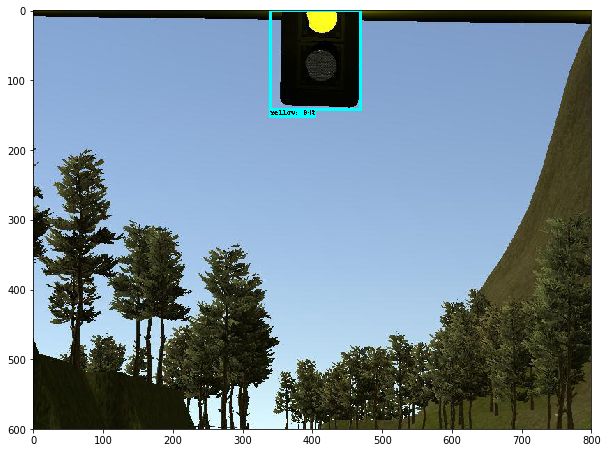

Yellow 0.94484925
Distance (metres) 0.0
Time in milliseconds 2110.0168228149414 



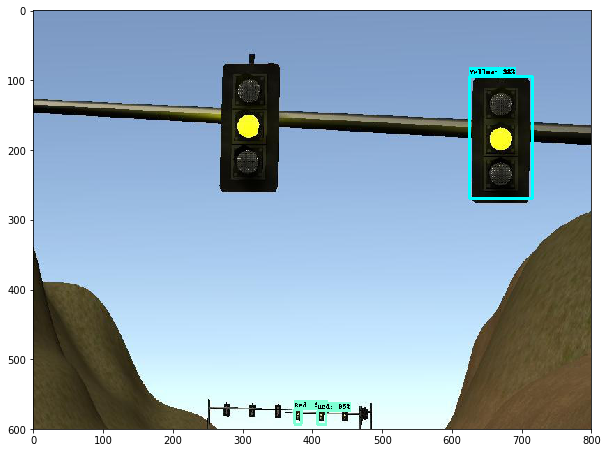

Red 0.98579866
Distance (metres) 0.0
Time in milliseconds 110.9018325805664 

Yellow 0.9819684
Distance (metres) 0.0
Time in milliseconds 110.9018325805664 

Red 0.95113707
Distance (metres) 0.0
Time in milliseconds 110.9018325805664 



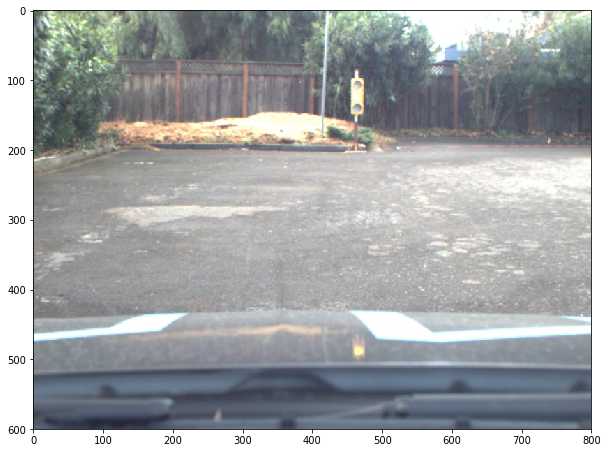

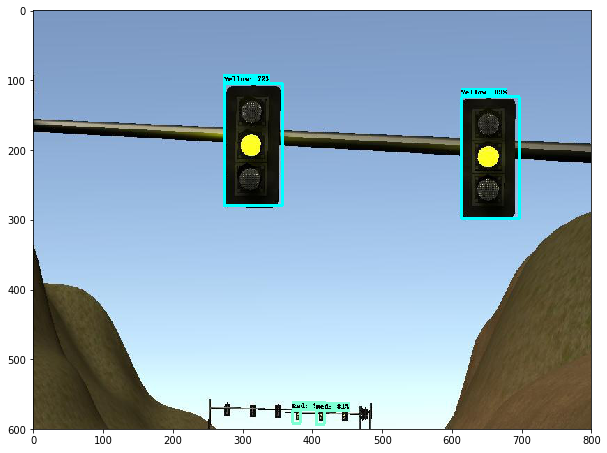

Red 0.9504078
Distance (metres) 0.0
Time in milliseconds 153.656005859375 

Yellow 0.8943037
Distance (metres) 0.0
Time in milliseconds 153.656005859375 

Red 0.8153357
Distance (metres) 0.0
Time in milliseconds 153.656005859375 

Yellow 0.72962177
Distance (metres) 0.0
Time in milliseconds 153.656005859375 



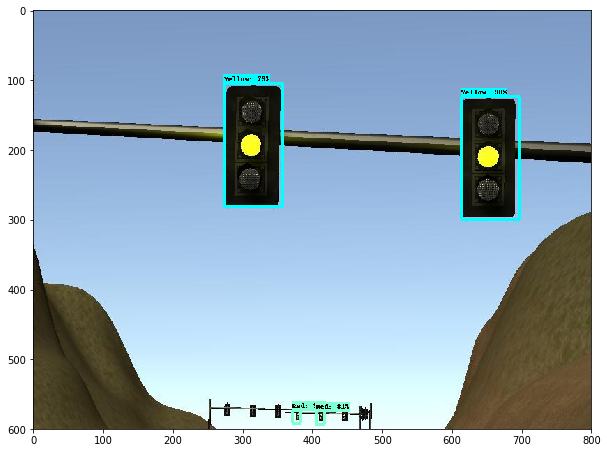

Red 0.9497095
Distance (metres) 0.0
Time in milliseconds 113.1138801574707 

Yellow 0.90137506
Distance (metres) 0.0
Time in milliseconds 113.1138801574707 

Red 0.8159888
Distance (metres) 0.0
Time in milliseconds 113.1138801574707 

Yellow 0.7319169
Distance (metres) 0.0
Time in milliseconds 113.1138801574707 



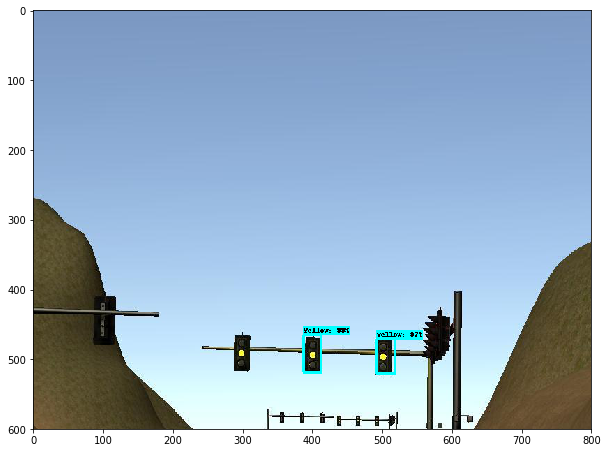

Yellow 0.9976079
Distance (metres) 0.0
Time in milliseconds 130.72776794433594 

Yellow 0.97099614
Distance (metres) 0.0
Time in milliseconds 130.72776794433594 



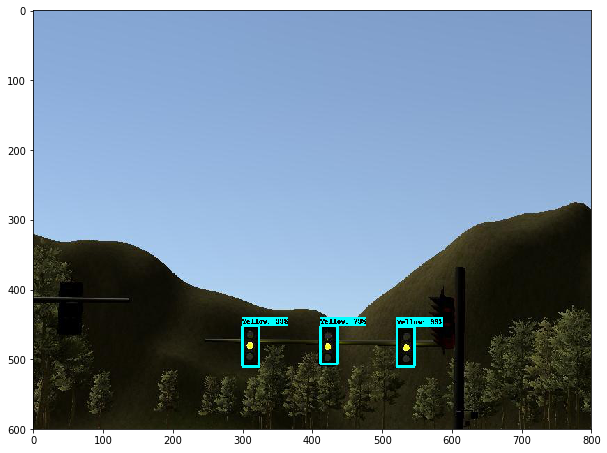

Yellow 0.99584675
Distance (metres) 0.0
Time in milliseconds 139.94431495666504 

Yellow 0.9936688
Distance (metres) 0.0
Time in milliseconds 139.94431495666504 

Yellow 0.7956016
Distance (metres) 0.0
Time in milliseconds 139.94431495666504 



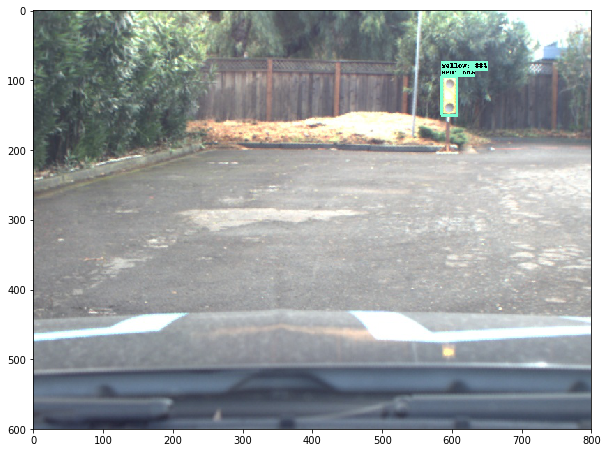

Yellow 0.88069564
Distance (metres) 0.0
Time in milliseconds 98.4640121459961 

Red 0.8679327
Distance (metres) 0.0
Time in milliseconds 98.4640121459961 



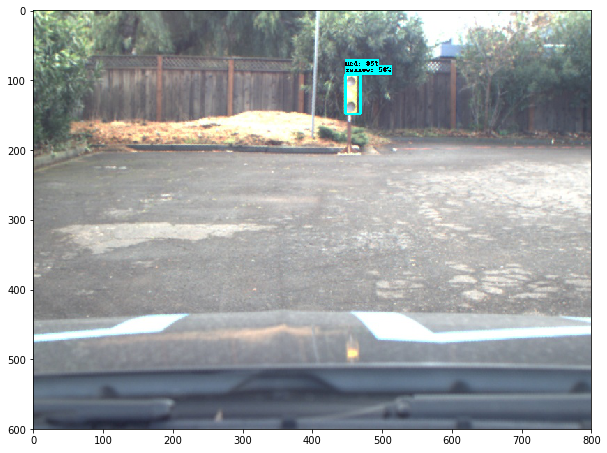

Red 0.9571429
Distance (metres) 0.0
Time in milliseconds 94.31910514831543 

Yellow 0.56884855
Distance (metres) 0.0
Time in milliseconds 94.31910514831543 



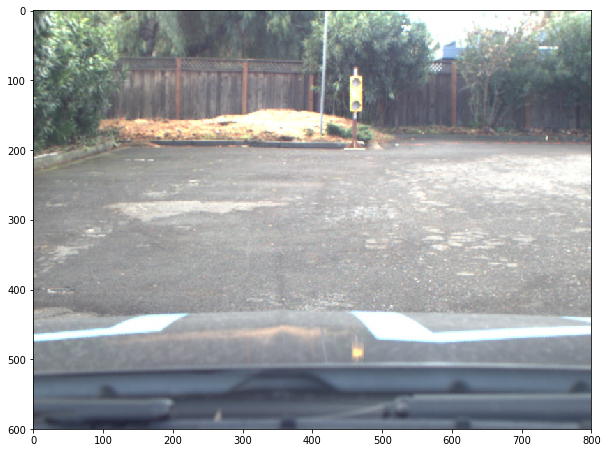

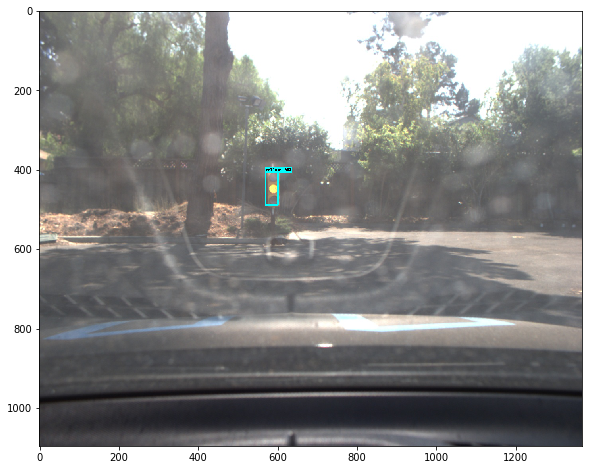

Yellow 0.99524605
Distance (metres) 0.0
Time in milliseconds 110.99481582641602 



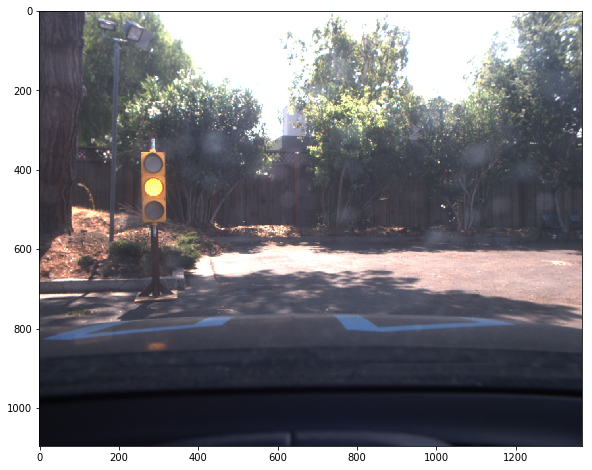

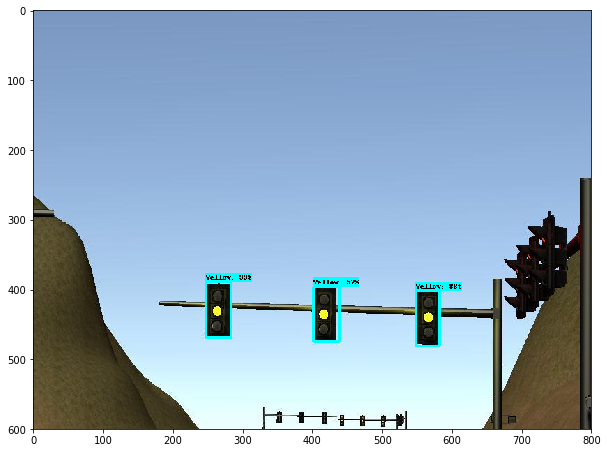

Yellow 0.9930948
Distance (metres) 0.0
Time in milliseconds 91.10403060913086 

Yellow 0.8881224
Distance (metres) 0.0
Time in milliseconds 91.10403060913086 

Yellow 0.5722139
Distance (metres) 0.0
Time in milliseconds 91.10403060913086 



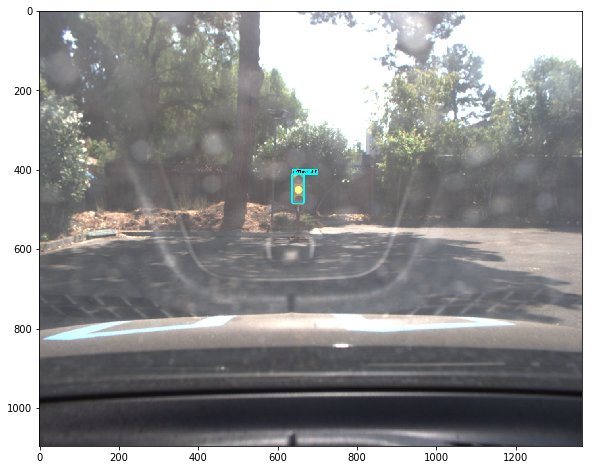

Yellow 0.9430995
Distance (metres) 0.0
Time in milliseconds 112.69283294677734 



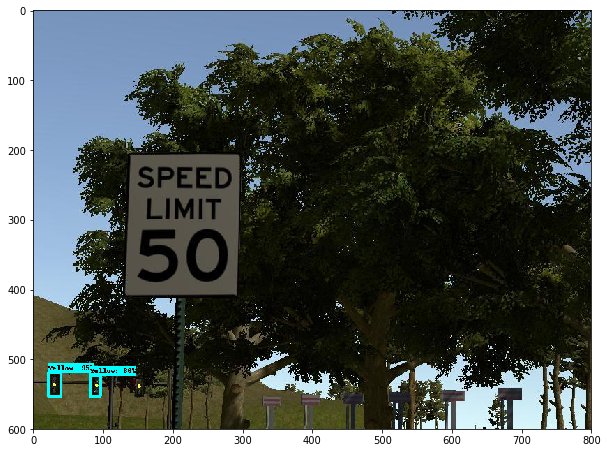

Yellow 0.9588834
Distance (metres) 0.0
Time in milliseconds 105.75294494628906 

Yellow 0.6600729
Distance (metres) 0.0
Time in milliseconds 105.75294494628906 



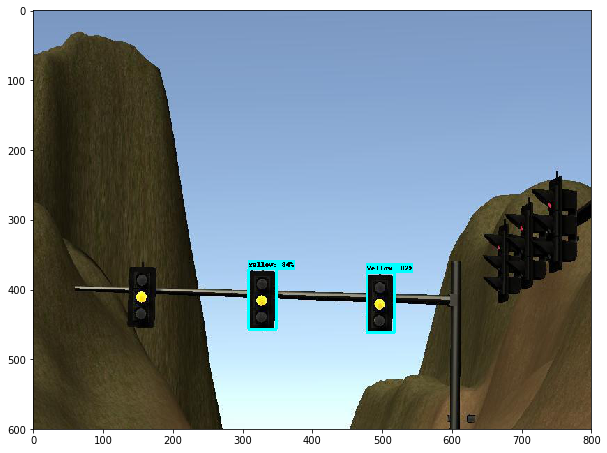

Yellow 0.8780539
Distance (metres) 0.0
Time in milliseconds 114.40396308898926 

Yellow 0.84534997
Distance (metres) 0.0
Time in milliseconds 114.40396308898926 



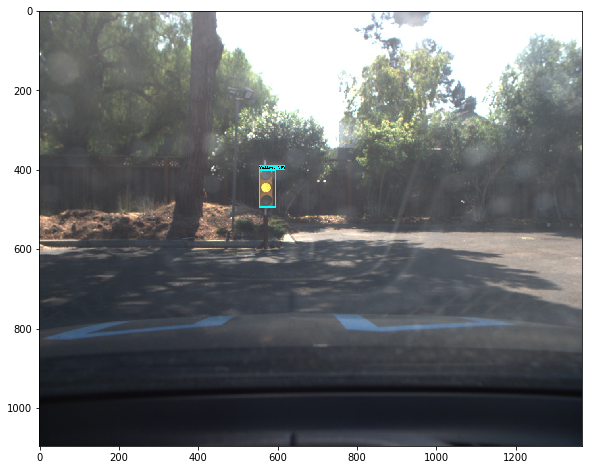

Yellow 0.9057552
Distance (metres) 0.0
Time in milliseconds 124.37701225280762 



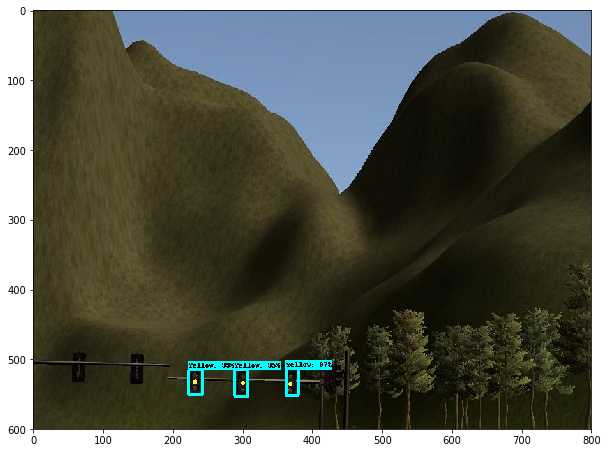

Yellow 0.9980886
Distance (metres) 0.0
Time in milliseconds 124.19629096984863 

Yellow 0.9793912
Distance (metres) 0.0
Time in milliseconds 124.19629096984863 

Yellow 0.9579426
Distance (metres) 0.0
Time in milliseconds 124.19629096984863 



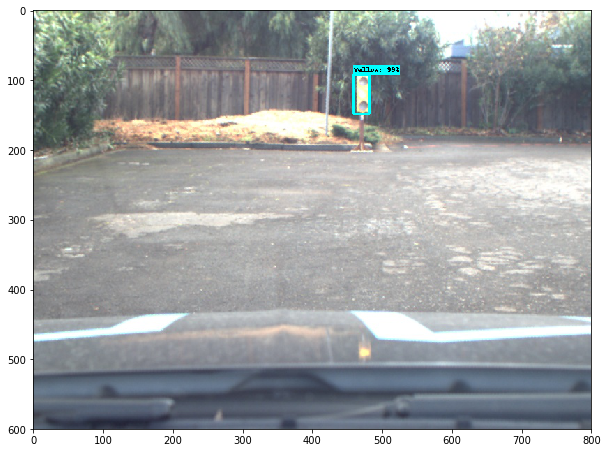

Yellow 0.99792665
Distance (metres) 0.0
Time in milliseconds 120.93639373779297 



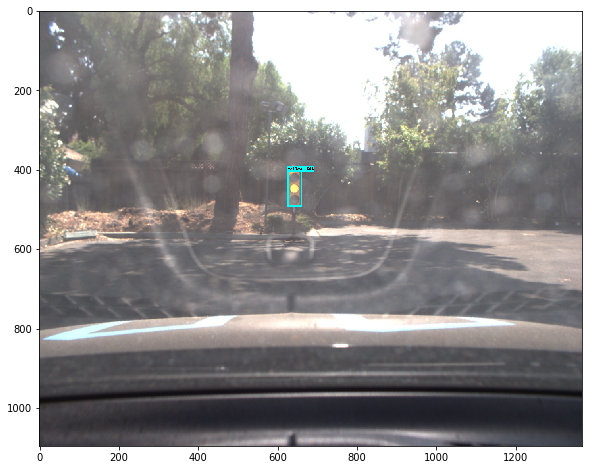

Yellow 0.68759024
Distance (metres) 0.0
Time in milliseconds 128.86404991149902 



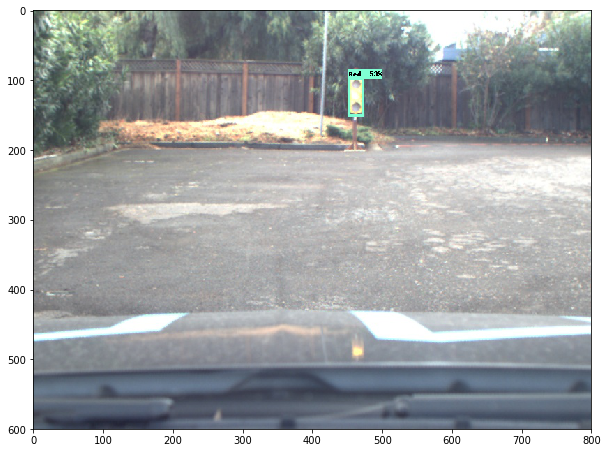

Red 0.5343903
Distance (metres) 0.0
Time in milliseconds 102.74100303649902 



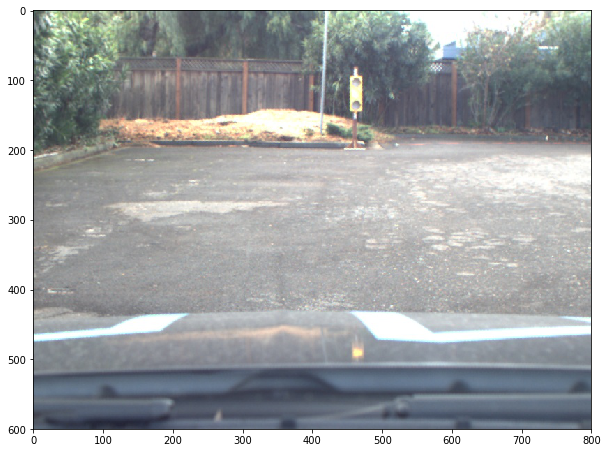

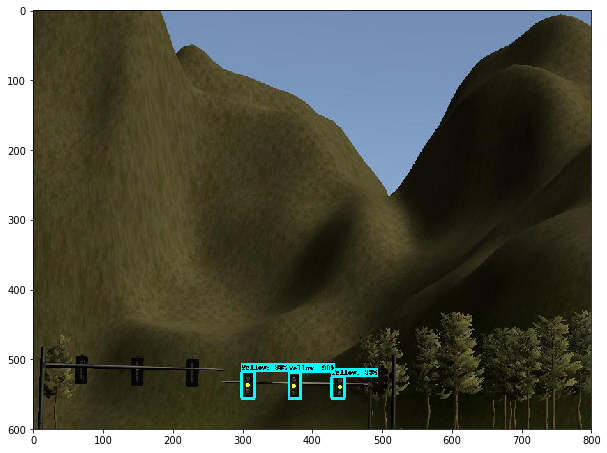

Yellow 0.9964161
Distance (metres) 0.0
Time in milliseconds 99.42078590393066 

Yellow 0.99184525
Distance (metres) 0.0
Time in milliseconds 99.42078590393066 

Yellow 0.902082
Distance (metres) 0.0
Time in milliseconds 99.42078590393066 



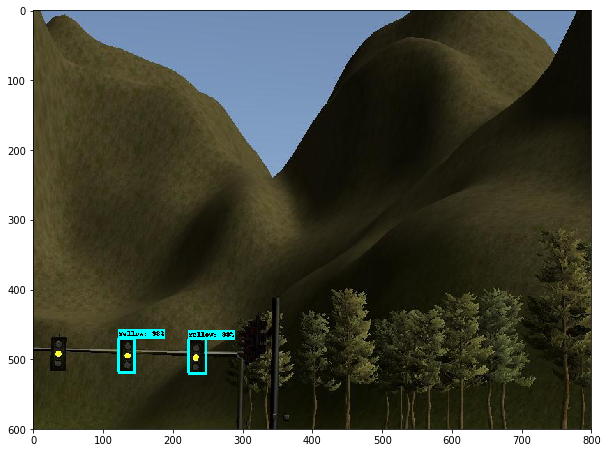

Yellow 0.9943323
Distance (metres) 0.0
Time in milliseconds 106.1699390411377 

Yellow 0.98157674
Distance (metres) 0.0
Time in milliseconds 106.1699390411377 



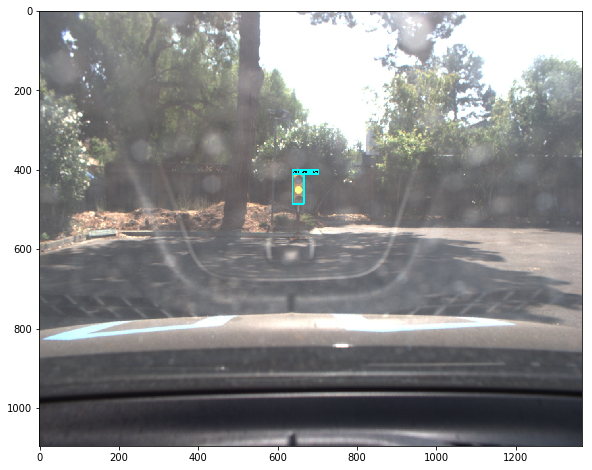

Yellow 0.92390025
Distance (metres) 0.0
Time in milliseconds 114.45212364196777 



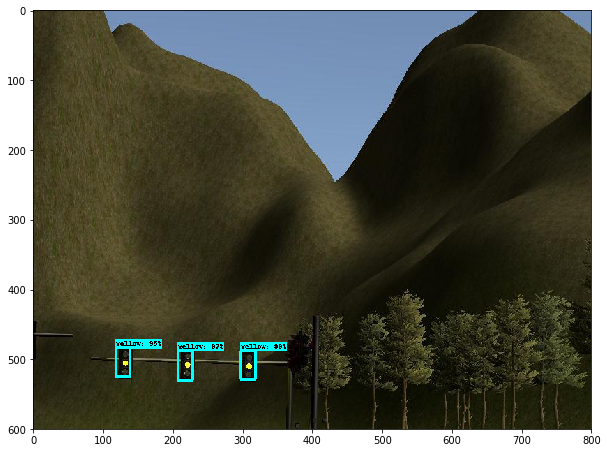

Yellow 0.9954862
Distance (metres) 0.0
Time in milliseconds 96.04310989379883 

Yellow 0.97455144
Distance (metres) 0.0
Time in milliseconds 96.04310989379883 

Yellow 0.9536276
Distance (metres) 0.0
Time in milliseconds 96.04310989379883 



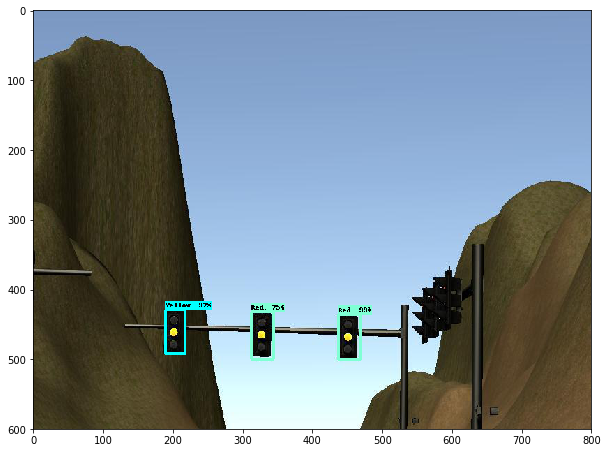

Red 0.9976969
Distance (metres) 0.0
Time in milliseconds 96.36831283569336 

Yellow 0.9727671
Distance (metres) 0.0
Time in milliseconds 96.36831283569336 

Red 0.75501966
Distance (metres) 0.0
Time in milliseconds 96.36831283569336 



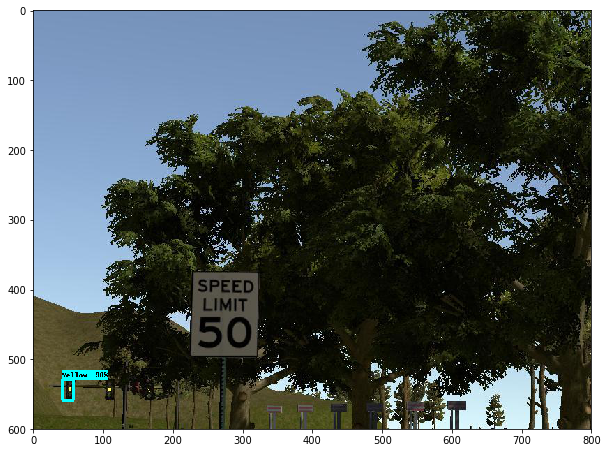

Yellow 0.9880986
Distance (metres) 0.0
Time in milliseconds 124.29618835449219 



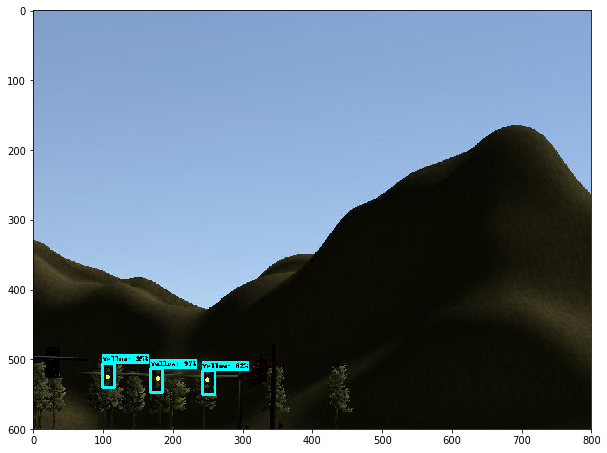

Yellow 0.97527933
Distance (metres) 0.0
Time in milliseconds 115.19098281860352 

Yellow 0.9510371
Distance (metres) 0.0
Time in milliseconds 115.19098281860352 

Yellow 0.62175375
Distance (metres) 0.0
Time in milliseconds 115.19098281860352 



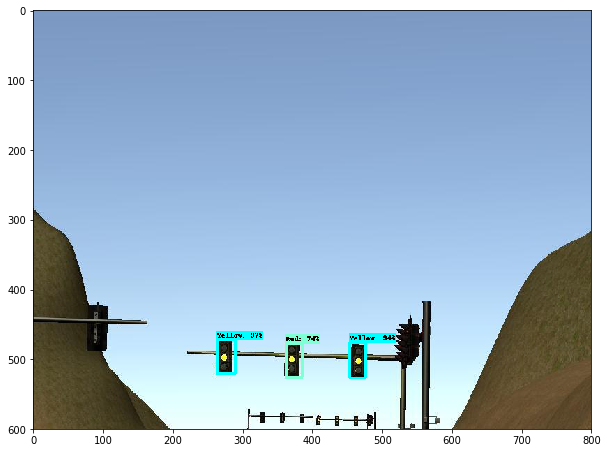

Yellow 0.9705868
Distance (metres) 0.0
Time in milliseconds 95.20101547241211 

Yellow 0.9494871
Distance (metres) 0.0
Time in milliseconds 95.20101547241211 

Red 0.7407423
Distance (metres) 0.0
Time in milliseconds 95.20101547241211 



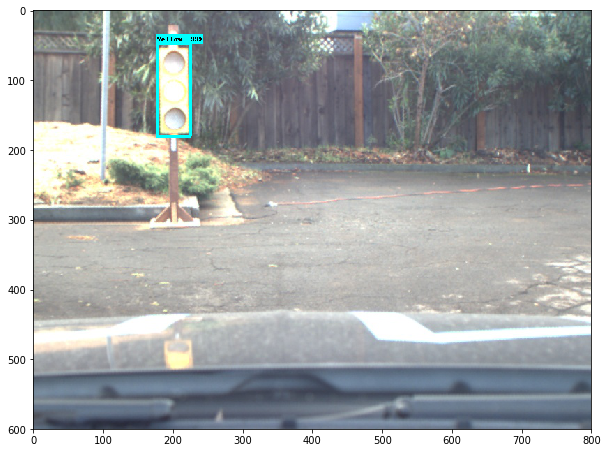

Yellow 0.9908401
Distance (metres) 0.0
Time in milliseconds 117.37394332885742 



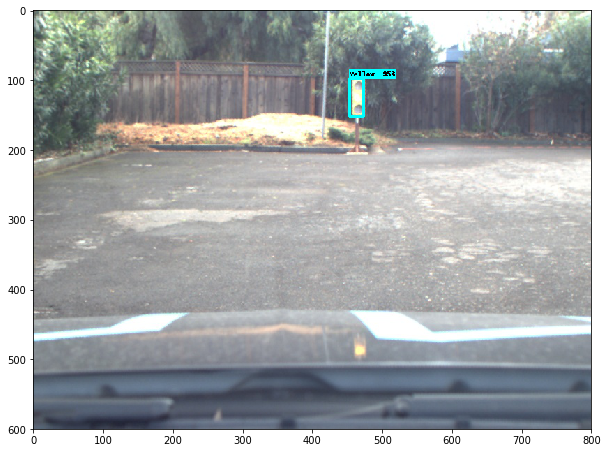

Yellow 0.95353776
Distance (metres) 0.0
Time in milliseconds 110.7020378112793 



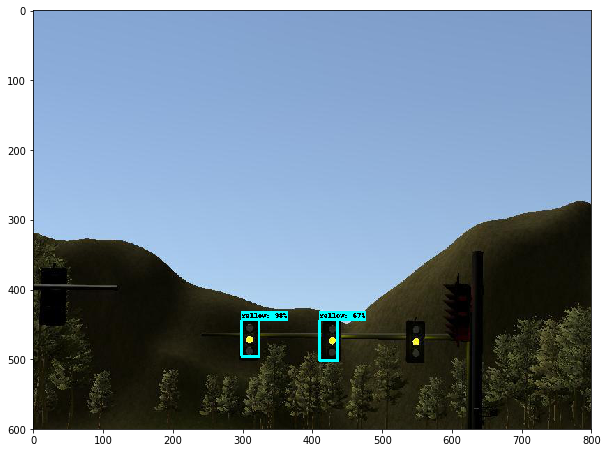

Yellow 0.98741037
Distance (metres) 0.0
Time in milliseconds 114.73917961120605 

Yellow 0.67494583
Distance (metres) 0.0
Time in milliseconds 114.73917961120605 



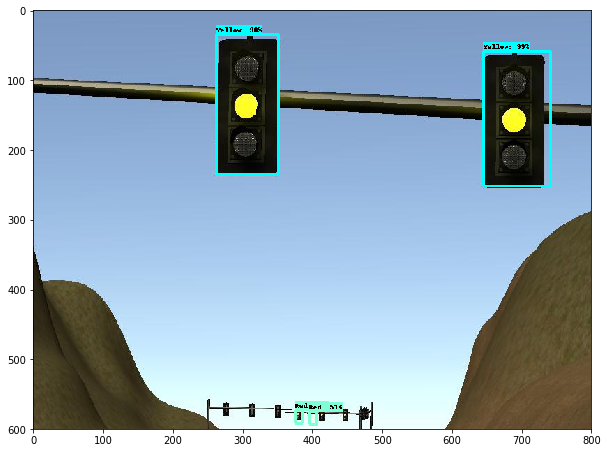

Yellow 0.9955032
Distance (metres) 0.0
Time in milliseconds 102.82015800476074 

Yellow 0.9834812
Distance (metres) 0.0
Time in milliseconds 102.82015800476074 

Red 0.83418477
Distance (metres) 0.0
Time in milliseconds 102.82015800476074 

Red 0.519511
Distance (metres) 0.0
Time in milliseconds 102.82015800476074 



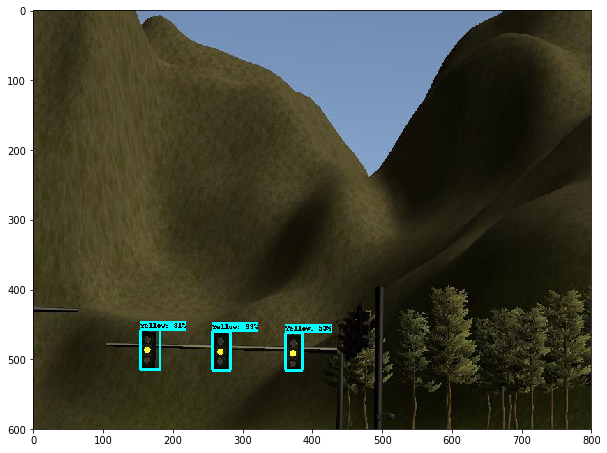

Yellow 0.9968618
Distance (metres) 0.0
Time in milliseconds 99.5640754699707 

Yellow 0.8125515
Distance (metres) 0.0
Time in milliseconds 99.5640754699707 

Yellow 0.5309787
Distance (metres) 0.0
Time in milliseconds 99.5640754699707 



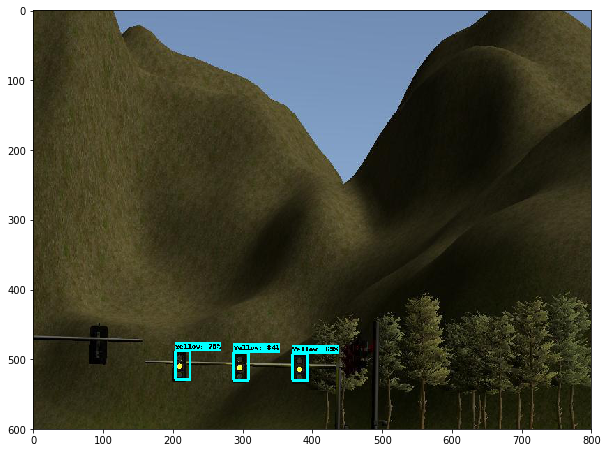

Yellow 0.8471973
Distance (metres) 0.0
Time in milliseconds 101.50671005249023 

Yellow 0.7512344
Distance (metres) 0.0
Time in milliseconds 101.50671005249023 

Yellow 0.69204015
Distance (metres) 0.0
Time in milliseconds 101.50671005249023 



In [12]:
%matplotlib inline
# Testing Yellow Lights:
DATA_DIR = os.path.join('..', 'test_images/yellow') 
DATA_PATHS = glob(os.path.join(DATA_DIR, '*.jpg'))
print("Length of test images:", len(DATA_PATHS))

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in DATA_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=4)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  0.97428  #1345.200806
                    fy =  1.73205  #1353.838257
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n")

